#### Diego Fernando Valle Morales

### 20003022

# Parte 2: Convolutional Network

#### Acerca del dataset

En esta segunda parte del proyecto se ha procedido a hacer una red convolucional usando el dataset de CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html) este conjunto de datos, consta de 60,000 imágenes en color de 32x32 pixeles en 10 clases, con 6,000 imágenes por clase. Hay 50,000 imágenes de entrenamiento y 10,000 imágenes de prueba.

El conjunto de datos se divide en cinco lotes de entrenamiento y un lote de prueba, cada uno con 10,000 imágenes. 

El lote de prueba contiene exactamente 1,000 imágenes seleccionadas al azar de cada clase. 

Los lotes de entrenamiento contienen las imágenes restantes en orden aleatorio, pero algunos lotes de entrenamiento pueden contener más imágenes de una clase que de otra. Entre ellos, los lotes de entrenamiento contienen exactamente 5,000 imágenes de cada clase.

#### Objetivo de la Red Convolucional

Se busca a través de la red Convolucional realizar la clasificación de las imágenes entre las distintas clases existentes, para lo cual se implementará PyTorch y Torchvision usando instalación local de Jupyter.

In [2]:
import torch 
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import numpy as np

In [3]:
seed = 0
np.random.seed(seed)
torch.manual_seed(seed)

In [4]:
# Configurando dispositivo
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

device = 'cpu'

transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
classes = ('plane', 'car', 'bird', 'cat','deer', 
           'dog', 'frog', 'horse', 'ship', 'truck')

#este código se comenta ya que se descargó el dataset
#train_dataset = torchvision.datasets.CIFAR10(root= 'p2', train=True, transform=transform, download=True)
#test_dataset = torchvision.datasets.CIFAR10(root = 'p2', train=False, transform=transform, download=True)

train_dataset = torchvision.datasets.CIFAR10(root= 'p2', train=True, transform=transform, download=False)
test_dataset = torchvision.datasets.CIFAR10(root = 'p2', train=False, transform=transform, download=False)

steps = []

Se obtienen las características del dataset

In [5]:
type(train_dataset)

torchvision.datasets.cifar.CIFAR10

In [6]:
train_dataset.class_to_idx

{'airplane': 0,
 'automobile': 1,
 'bird': 2,
 'cat': 3,
 'deer': 4,
 'dog': 5,
 'frog': 6,
 'horse': 7,
 'ship': 8,
 'truck': 9}

In [7]:
train_dataset.data[1]

array([[[154, 177, 187],
        [126, 137, 136],
        [105, 104,  95],
        ...,
        [ 91,  95,  71],
        [ 87,  90,  71],
        [ 79,  81,  70]],

       [[140, 160, 169],
        [145, 153, 154],
        [125, 125, 118],
        ...,
        [ 96,  99,  78],
        [ 77,  80,  62],
        [ 71,  73,  61]],

       [[140, 155, 164],
        [139, 146, 149],
        [115, 115, 112],
        ...,
        [ 79,  82,  64],
        [ 68,  70,  55],
        [ 67,  69,  55]],

       ...,

       [[175, 167, 166],
        [156, 154, 160],
        [154, 160, 170],
        ...,
        [ 42,  34,  36],
        [ 61,  53,  57],
        [ 93,  83,  91]],

       [[165, 154, 128],
        [156, 152, 130],
        [159, 161, 142],
        ...,
        [103,  93,  96],
        [123, 114, 120],
        [131, 121, 131]],

       [[163, 148, 120],
        [158, 148, 122],
        [163, 156, 133],
        ...,
        [143, 133, 139],
        [143, 134, 142],
        [143, 133, 144]]

In [8]:
train_dataset.targets[1]

9

Etiqueta: truck


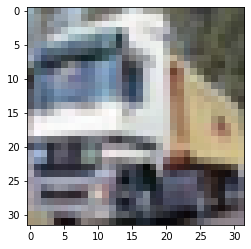

In [10]:
import matplotlib.pyplot as plt
DIM = 36
CH = 3
x = np.random.randint(50000)
train_dataset.train_list[2]
print('Etiqueta: {}'.format(classes[train_dataset.targets[1]]))
plt.imshow(train_dataset.data[1])

Se procede a crear una red Neural Convolucional con dos capas convolucionales, se estima que con esta arquitectura se puede tener solución a este problema.

In [11]:
# Red neural convolucional
# con dos capas convolucionales
class ConvNet(nn.Module):
    def __init__(self, num_classes=10):
        super(ConvNet, self).__init__()
        #CAPA 1
        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        #CAPA 2
        self.layer2 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.fc = nn.Linear(8*8*32, num_classes)
        
    def forward(self, x):
        step = []
        step.append(x)
        out = self.layer1(x)
        step.append(out);
        out = self.layer2(out)
        step.append(out)
        out = out.reshape(out.size(0), -1)
        out = self.fc(out)
        steps.append(step)
        return out

In [12]:
def train(epochs, batch_size, lr):
    # Hiperparámetros
    steps = []
    num_epochs = epochs
    num_classes = 10
    batch_size = batch_size
    learning_rate = lr

    # Carga de Datos
    train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                               batch_size=batch_size, 
                                               shuffle=True)

    test_loader = torch.utils.data.DataLoader(dataset=test_dataset,
                                              batch_size=batch_size, 
                                              shuffle=False)

    model = ConvNet(num_classes).to(device)

    # Pérdida y optimizador Adam
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

    # Entrenando el modelo
    total_step = len(train_loader)
    for epoch in range(num_epochs):
        for i, (images, labels) in enumerate(train_loader):
            images = images.to(device)
            labels = labels.to(device)

            # Paso adelante
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backward y optimizando
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            if (i+1) % 100 == 0:
                print ('Epoch [{}/{}], Paso [{}/{}], Perdida: {:.4f}' 
                       .format(epoch+1, num_epochs, i+1, total_step, loss.item()))

    # Probando el modelo
    #modo de evaluación (batchnorm usa una media/varianza móvil en vez de una media/varianza de mini-batch)
    model.eval() 
    with torch.no_grad():
        correct = 0
        total = 0
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        print('Prueba de certeza del modelo al probar las 10,000 imágenes de prueba: {} %'.format(100 * correct / total))

    # Guarda un checkpoint del modelo
    torch.save(model.state_dict(), 'cnn_'+str(epochs)+'_'+str(batch_size)+'_'+str(lr)+'.ckpt')

Se procede a realizar experimentos variando los parámetros para obtener una mayor certeza en los datos.

**EXPERIMENTO 1**

Se utilizarán 10 epochs con 256 de tamaño del batch y un learning rate de 0.005.

In [6]:
train(10, 256, 0.005)

Epoch [1/10], Paso [100/196], Perdida: 1.3204
Epoch [2/10], Paso [100/196], Perdida: 1.0978
Epoch [3/10], Paso [100/196], Perdida: 0.9759
Epoch [4/10], Paso [100/196], Perdida: 0.8195
Epoch [5/10], Paso [100/196], Perdida: 0.8413
Epoch [6/10], Paso [100/196], Perdida: 0.9301
Epoch [7/10], Paso [100/196], Perdida: 0.6423
Epoch [8/10], Paso [100/196], Perdida: 0.6936
Epoch [9/10], Paso [100/196], Perdida: 0.6260
Epoch [10/10], Paso [100/196], Perdida: 0.6295
Prueba de certeza del modelo al probar las 10,000 imágenes de prueba: 68.69 %


**EXPERIMENTO 2**

Se vuelven a usar 10 epochs con 512 de tamaño del batch y learning rate de 0.005.

In [7]:
train(10, 512, 0.005)

Prueba de certeza del modelo al probar las 10,000 imágenes de prueba: 69.52 %


**EXPERIMENTO 3**

Se vuelven a usar 10 epochs con 768 de tamaño del batch y learning rate de 0.001.

In [52]:
train(10, 768, 0.001)

Prueba de certeza del modelo al probar las 10,000 imágenes de prueba: 68.27 %


**EXPERIMENTO 4**

Se amplía a 15 epochs con 512 de tamaño del batch y learning rate de 0.001.

In [13]:
train(15, 512, 0.001)

Prueba de certeza del modelo al probar las 10,000 imágenes de prueba: 70.06 %


Se ha logrado una certeza de 70.06% con el dataset, por lo que se puede observar a mayor número de epochs mejora el entrenamiento del modelo, por tema de recursos del equipo, no se pudo disponer de más tiempo para realizar más experimentos y afinar el modelo, cada uno de los resultados fue exportado a archivos ckpt.

Posterior a esto se procede a validar el dataset y a realizar el resultado en las diferentes capas de la red neural.

In [15]:
torch.cuda.empty_cache() 

In [16]:
import matplotlib.pyplot as plt
steps = np.array(steps)
steps.shape

(1490, 3)

Se muestran a continuación las imágenes de entrada.

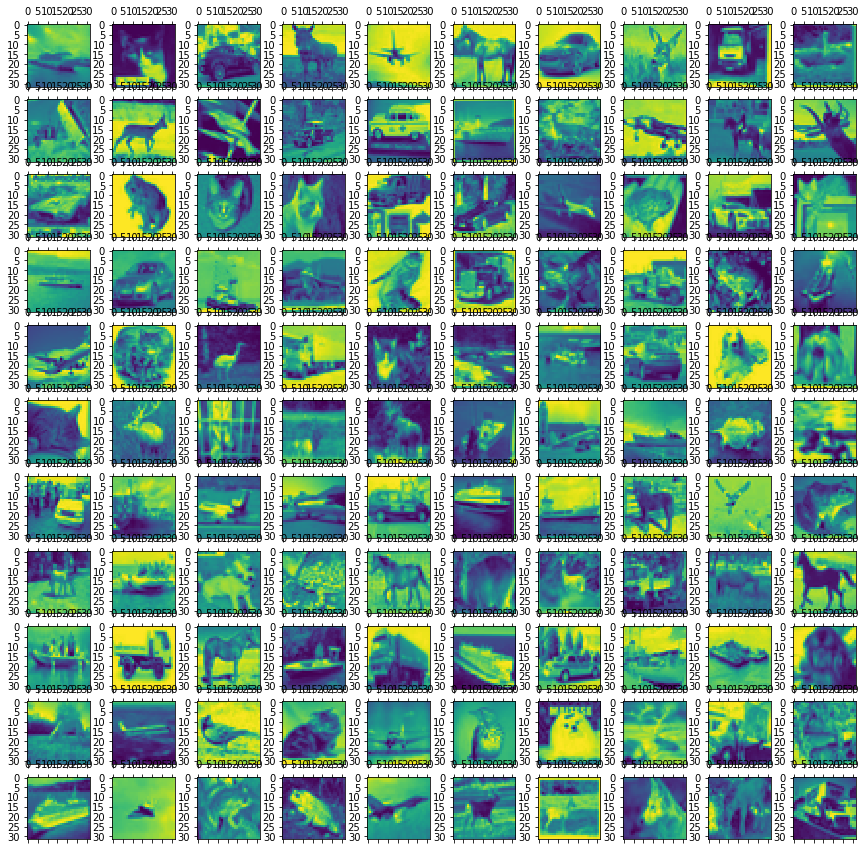

In [21]:
figsize = (20, 20)
cases = 100
cols = 10
rows = cases // cols + 1

fig, ax = plt.subplots(nrows=rows, ncols=cols,figsize=(15,15))
i = 0
for row in ax:
    for col in row:
        col.matshow(steps[i][0][0][0])
        i+=1

Se muestra la información en la primera capa. Se puede observar que se está descomponiendo la imagen. Se pinta en tonalidades "plasma".

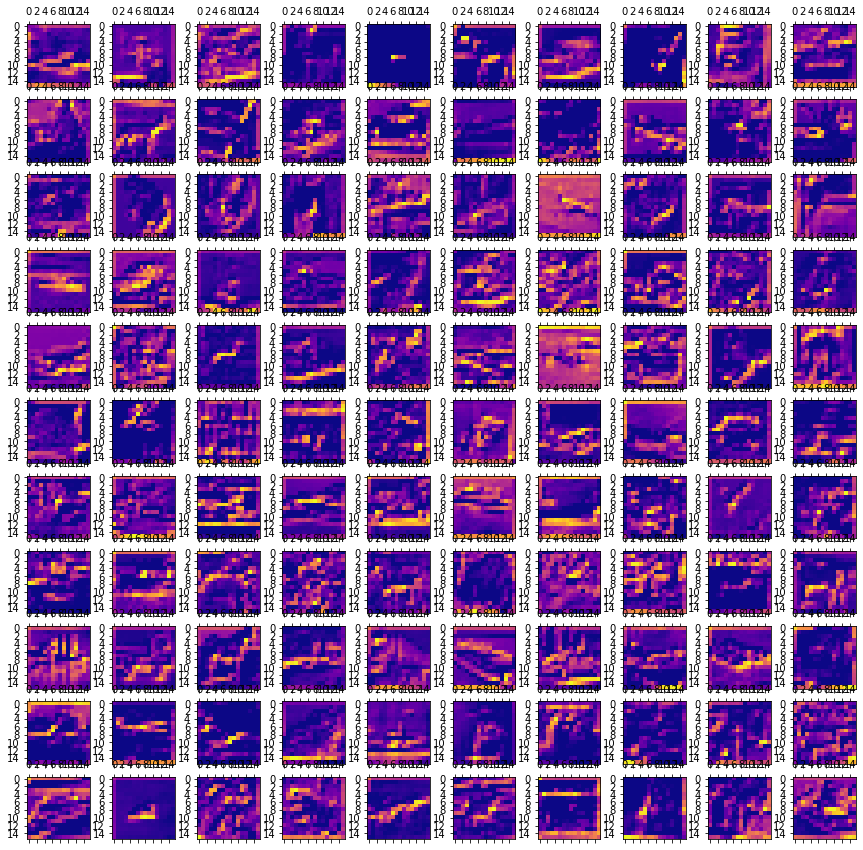

In [18]:
figsize = (20, 20)
cases = 100
cols = 10
rows = cases // cols + 1

fig, ax = plt.subplots(nrows=rows, ncols=cols,figsize=(15,15))
i = 0
for row in ax:
    for col in row:
        col.matshow((steps[i][1].detach().numpy())[0][0], cmap='plasma')
        i+=1

Se muestra en la segunda capa, se puede observar que el modelo ha descompuesto más las características.

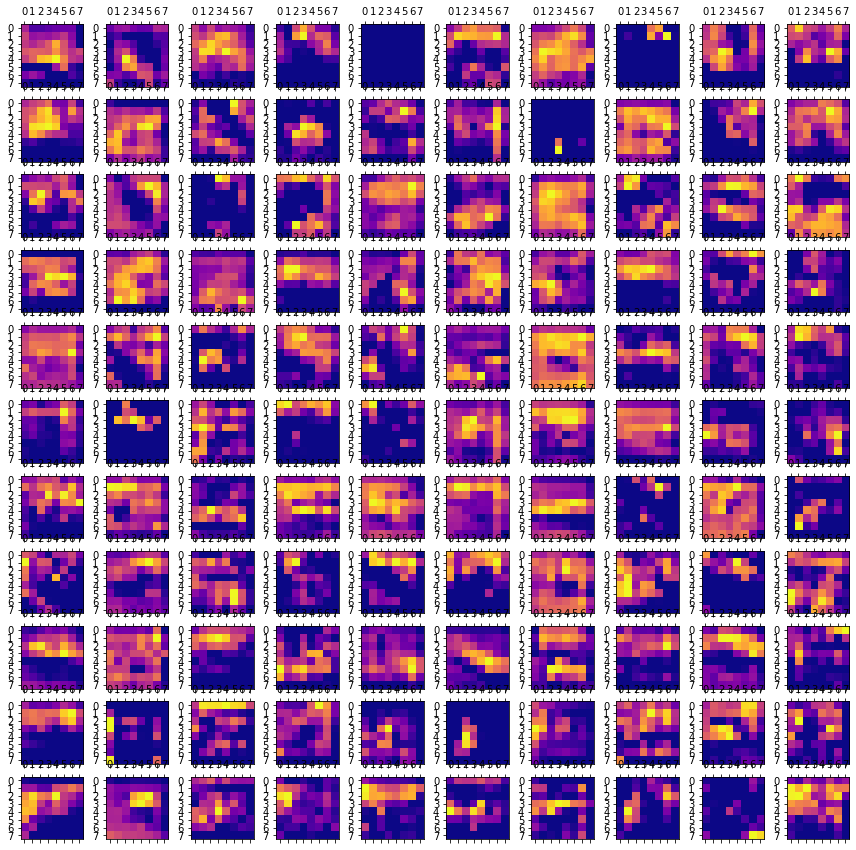

In [19]:
figsize = (20, 20)
cases = 100
cols = 10
rows = cases // cols + 1

fig, ax = plt.subplots(nrows=rows, ncols=cols,figsize=(15,15))
i = 0
for row in ax:
    for col in row:
        col.matshow((steps[i][2].detach().numpy())[0][0], cmap='plasma')
        i+=1

A continuación se muestran más a detalle.

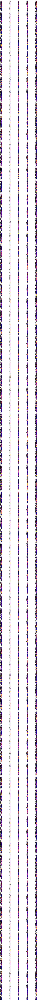

In [20]:
cases = steps[0].shape[0]*steps[0][0].shape[0]*steps[0][0][0].shape[0]
cols = 5

rows = cases // cols + 1

fig, ax = plt.subplots(nrows=rows, ncols=cols,figsize=(25,600))
i = 0
j = 0
k = 0
l = 0
for row in ax:
    for col in row:
        col.matshow((steps[l][j].detach().numpy())[0][k], cmap='plasma')
        if k+1< steps[0][j][0].shape[0]:
            k+=1
        else:
            k=0
            if j+1 < steps[0].shape[0]:
                j+= 1
            else:
                j=0
                l+=1
        i+=1
plt.show()